# 번호판 추론 테스트 노트북

`e2e_korean_plate.py` 모듈을 이용해 YOLOv8 탐지 + Tesseract OCR 파이프라인을 실행하고 결과를 확인합니다.

In [2]:

from pathlib import Path
import os
import sys

# 프로젝트 로컬 가상환경을 노트북에서도 사용 가능하도록 경로를 등록합니다.
VENV_DIR = Path('venv')
if not VENV_DIR.exists():
    raise FileNotFoundError(f'가상환경을 찾을 수 없습니다: {VENV_DIR.resolve()}')

site_packages = sorted((VENV_DIR / 'lib').glob('python*/site-packages'))
if not site_packages:
    raise FileNotFoundError('site-packages 디렉터리를 찾을 수 없습니다. 가상환경 구성을 확인하세요.')
site_packages_path = site_packages[0].resolve()
if str(site_packages_path) not in sys.path:
    sys.path.insert(0, str(site_packages_path))

os.environ['VIRTUAL_ENV'] = str(VENV_DIR.resolve())
bin_path = (VENV_DIR / 'bin').resolve()
path_value = os.environ.get('PATH', '')
if path_value:
    parts = path_value.split(':')
    if str(bin_path) not in parts:
        os.environ['PATH'] = f"{bin_path}:{path_value}"
else:
    os.environ['PATH'] = str(bin_path)

print('가상환경 경로 설정 완료:', VENV_DIR.resolve())
print('현재 커널 파이썬:', sys.executable)


가상환경 경로 설정 완료: /home/work/llama_young/차량번호판인식_yolov8/venv
현재 커널 파이썬: /usr/bin/python


In [3]:

import json
from pathlib import Path

import torch
from IPython.display import display
from PIL import Image

from e2e_korean_plate import run_e2e


Error.  nthreads cannot be larger than environment variable "NUMEXPR_MAX_THREADS" (8)

In [ ]:

# ----- 설정 -----
WEIGHTS = Path('runs/license_plate_yolov8n/weights/best.pt')
INPUT_IMAGE = Path('samples/example.jpg')  # 단일 이미지 테스트
OUTPUT_DIR = Path('out_demo')
CONF_THRESH = 0.55
IOU_THRESH = 0.65
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print('weights:', WEIGHTS)
print('input image:', INPUT_IMAGE)
print('output dir:', OUTPUT_DIR.resolve())


weights: runs/license_plate_yolov8n/weights/best.pt
input image: samples/example.jpg
output dir: /home/work/llama_young/차량번호판인식_yolov8/out_demo


In [5]:

# ----- 추론 실행 -----
results = run_e2e(
    weights=WEIGHTS,
    image=INPUT_IMAGE,
    out_dir=OUTPUT_DIR,
    conf=CONF_THRESH,
    iou=IOU_THRESH,
    device=DEVICE,
    save_crops=True,
    save_flats=True,
    save_annotated=True,
    save_bin_best=False,
)
print(json.dumps(results, ensure_ascii=False, indent=2))


{
  "json": "out_demo/results.json",
  "csv": "out_demo/results.csv",
  "count": 2,
  "out_dir": "out_demo"
}


탐지 수: 2
첫 번째 결과: {'image': 'samples/example.jpg', 'bbox': [484, 1753, 2204, 2598], 'conf': 0.5904423594474792, 'text': '01가-12443787211나31100113가사아마201나01', 'score': 0, 'raw': '0     1   가\n -\n  12\n\n  4  4\n 3\n      78\n   7  21  1 나\n 3 1 10\n0\n1 1\n   3\n     가 사아 마\n    2  01나01', 'crop_path': 'out_demo/crops/example_b0.png', 'flat_path': 'out_demo/flats/example_b0_flat.png', 'bin_best_path': ''}


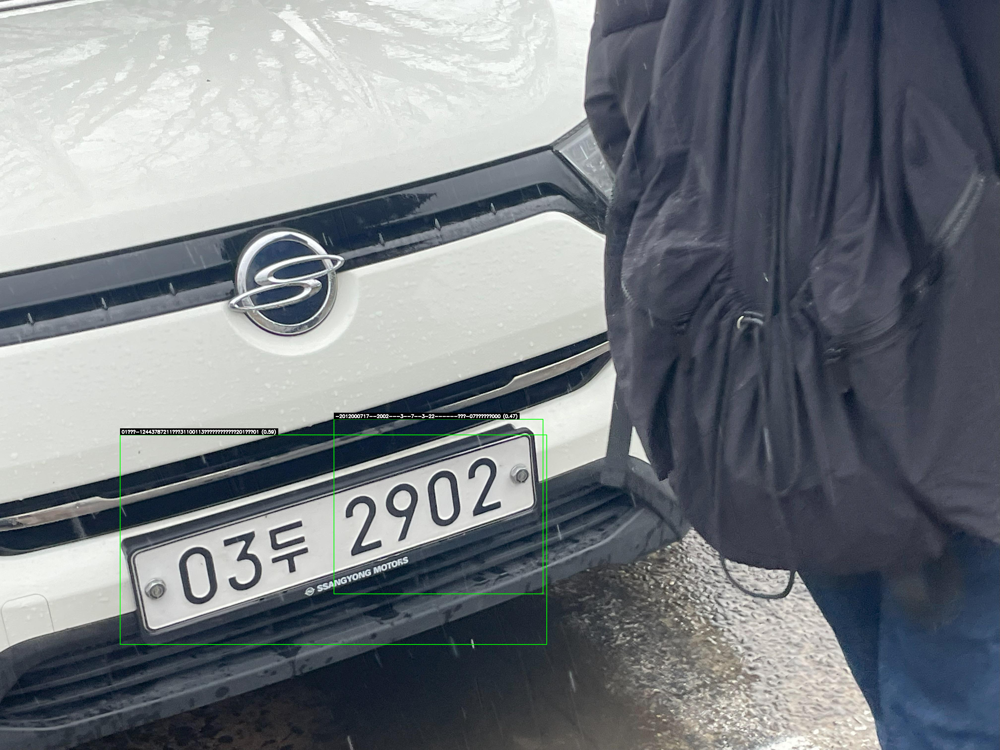

번호판 크롭 이미지:


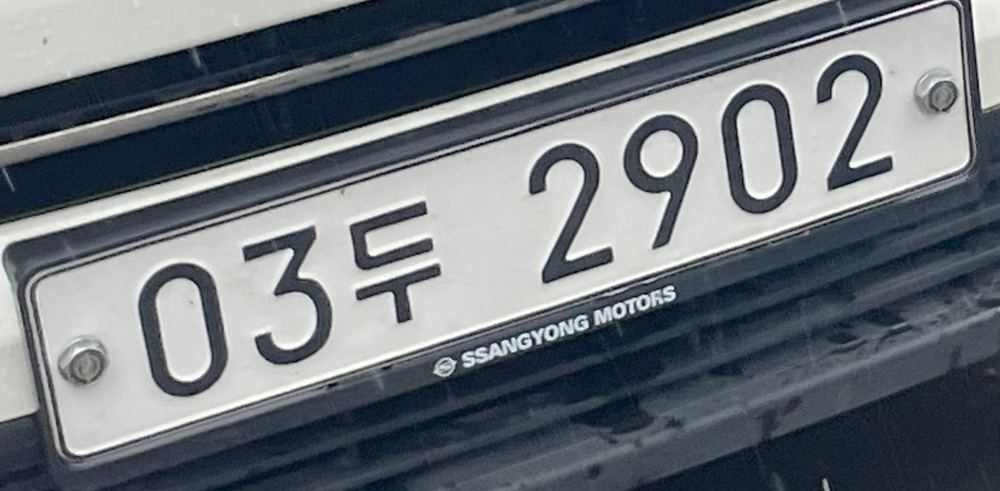

In [6]:

# ----- 결과 확인 -----
json_path = Path(results['json'])
with open(json_path, 'r', encoding='utf-8') as f:
    detections = json.load(f)

if detections:
    first = detections[0]
    print('탐지 수:', len(detections))
    print('첫 번째 결과:', first)

    annotated = Path(results['out_dir']) / 'annotated' / f"{Path(first['image']).stem}_annotated.png"
    if annotated.exists():
        display(Image.open(annotated))
    if first.get('crop_path') and Path(first['crop_path']).exists():
        print('번호판 크롭 이미지:')
        display(Image.open(first['crop_path']))
else:
    print('탐지 결과가 없습니다.')
